## GreenBytes 

GreenBytes forcasts sales in restaurants to reduce food waste. In this scrip we take into account weather data and information about COVID cases to help in the predictions.

In [178]:
import numpy as np
import pandas as pd

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

### Data and Pre-Processing
The data used to train this model is the pre existing data that we have from our partner reasturant as well as the weather data for Reykjavik from Veðurstofa Íslands as well as the data about daily COVID cases and number of people in isolation from covid.is.

In [4]:
weather = pd.read_csv('data/weather.csv')
covid = pd.read_csv('data/COVID-data.csv',index_col='Date')
sales = pd.read_csv('data/sales0102-2409.csv')
sales

,Unnamed: 0,Dags reiknings,Kassanúmer,Vörunúmer,Lýsing,Magn,Upphæð m/VSK,Lýsing-stem,Price Per,ID
0,281,2020-01-01,21.0,0.0,0.0,0.0,0.0,0.0,0.0,54.0
1,101,2020-01-01,31.0,0.0,0.0,0.0,0.0,0.0,0.0,75.0
2,100,2020-01-01,31.0,0.0,0.0,0.0,0.0,0.0,0.0,67.0
3,99,2020-01-01,31.0,0.0,0.0,0.0,0.0,0.0,0.0,65.0
4,98,2020-01-01,31.0,0.0,0.0,0.0,0.0,0.0,0.0,57.0
...,...,...,...,...,...,...,...,...,...,...
309289,81446,2020-09-24,21.0,5001,engiferot,1.0,390.0,['engiferot'],390.0,6.0
309290,81445,2020-09-24,21.0,2005,2 chickencado,1.0,1690.0,"['2', 'chickencado']",1690.0,8.0
309291,81444,2020-09-24,2.0,2041,3 hangover kombó,1.0,1195.0,"['3', 'hangov', 'kombó']",1195.0,30.0
309292,81460,2020-09-24,21.0,6026,2 chickencado,1.0,1195.0,"['2', 'chickencado']",1195.0,8.0


In [5]:
sales.drop(['Unnamed: 0','Vörunúmer','Lýsing-stem','Price Per'],axis=1,inplace=True)

In [6]:
# Select store
sales = sales[sales['Kassanúmer']==2]
sales

,Dags reiknings,Kassanúmer,Lýsing,Magn,Upphæð m/VSK,ID
9,2020-01-01,2.0,0.0,0.0,0.0,54.0
10,2020-01-01,2.0,0.0,0.0,0.0,53.0
11,2020-01-01,2.0,0.0,0.0,0.0,91.0
12,2020-01-01,2.0,0.0,0.0,0.0,85.0
13,2020-01-01,2.0,0.0,0.0,0.0,84.0
...,...,...,...,...,...,...
309285,2020-09-24,2.0,spicy tuna,1.0,795.0,77.0
309287,2020-09-24,2.0,presley,1.0,1195.0,69.0
309288,2020-09-24,2.0,spicy chicken,1.0,1195.0,75.0
309291,2020-09-24,2.0,3 hangover kombó,1.0,1195.0,30.0


In [7]:
prodList = pd.read_csv('data/menuKeys.csv')
prodList = pd.Series(prodList['Menu Item'].values,index=prodList.ID).to_dict()
len(prodList)

94

In [8]:
sales['Discription']= sales['ID'].map(prodList)

Determine the number of sales per day

In [9]:
perDay = pd.pivot_table(sales,index=['Dags reiknings'],
                        columns='Discription',values='Magn',
                        aggfunc=np.sum,fill_value=0)

In [10]:
perDay['total']=perDay.sum(axis=1)
perDay

Discription,alabama,alabama lítil,avócadó,bergtoppur stórógarberja,caffe latte,cappucino,chango,chango lítil,chickencado,chickencado lítil,...,toppur kolsýrt vatn,tunacado,tunacado lítil,túmerikskot,vanilla flirt,vanilla flirt lítil,vatn 330 ml,winston wolf,winston wolf lítil,total
Dags reiknings,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0
2020-02-01,10,0,0,0,3,0,27,2,81,5,...,2,7,5,0,4,1,2,0,0,614.0
2020-02-02,4,0,0,0,2,0,36,1,64,7,...,1,14,1,0,0,0,0,1,1,544.0
2020-02-03,5,1,0,0,3,0,87,0,55,6,...,0,14,1,0,7,1,1,1,0,617.0
2020-02-04,5,0,0,0,3,0,30,0,65,4,...,1,11,2,0,1,0,0,1,0,605.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-20,9,1,0,0,1,0,19,0,67,8,...,0,8,1,0,1,0,0,1,0,511.0
2020-09-21,31,0,0,0,3,0,44,0,83,4,...,5,12,6,0,4,0,0,2,0,707.0
2020-09-22,34,1,0,0,0,0,28,0,84,4,...,2,12,3,0,8,0,0,3,0,706.0


## Feature Engineering

In [11]:
weather['Date'] = pd.to_datetime(weather['Date'])
weather.set_index('Date',inplace=True)

In [12]:
perDay['Date'] = pd.to_datetime(perDay.index)
perDay['day of week'] = perDay['Date'].apply(lambda date:date.dayofweek)
perDay.drop('Date',axis=1,inplace=True)

Add Weather and Sales data to one dataframe

In [13]:
perDay.index=pd.to_datetime(perDay.index)
covid.index=pd.to_datetime(covid.index)

In [14]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 244 entries, 2020-02-28 to 2020-10-28
Data columns (total 2 columns):
Daily Total    244 non-null int64
Isolation      244 non-null int64
dtypes: int64(2)
memory usage: 5.7 KB


In [15]:
perDay.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 231 entries, 2020-01-01 to 2020-09-24
Data columns (total 96 columns):
alabama                     231 non-null int64
alabama lítil               231 non-null int64
avócadó                     231 non-null int64
bergtoppur stórógarberja    231 non-null int64
caffe latte                 231 non-null int64
cappucino                   231 non-null int64
chango                      231 non-null int64
chango lítil                231 non-null int64
chickencado                 231 non-null int64
chickencado lítil           231 non-null int64
chickencurry                231 non-null int64
chickencurry lítil          231 non-null int64
coke                        231 non-null int64
coke lite                   231 non-null int64
coke zero                   231 non-null int64
dazed                       231 non-null int64
dazed lítil                 231 non-null int64
django                      231 non-null int64
django lítil                23

In [16]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 243 entries, 2020-02-01 to 2020-09-30
Data columns (total 10 columns):
Mean Temp (°C) 2         243 non-null float64
High Temp (°C) 3         243 non-null float64
Low Temp (°C) 4          243 non-null float64
Precipitation (mm)       243 non-null float64
Snow Depth               243 non-null int64
snjóhula (0-4)           243 non-null int64
Sunlight Hours (klst)    243 non-null float64
Mean Wind (m/s)          243 non-null float64
Max Wind (m/s)           243 non-null float64
Gust (m/s)               243 non-null float64
dtypes: float64(8), int64(2)
memory usage: 20.9 KB


In [17]:
df = perDay.join(covid)
df = df.join(weather)
df.dropna(inplace=True)
df

,alabama,alabama lítil,avócadó,bergtoppur stórógarberja,caffe latte,cappucino,chango,chango lítil,chickencado,chickencado lítil,...,Mean Temp (°C) 2,High Temp (°C) 3,Low Temp (°C) 4,Precipitation (mm),Snow Depth,snjóhula (0-4),Sunlight Hours (klst),Mean Wind (m/s),Max Wind (m/s),Gust (m/s)
2020-02-28,3,1,0,1,3,0,24,4,125,5,...,-0.3,1.7,-3.3,5.0,9.0,4.0,1.0,4.1,13.5,22.8
2020-02-29,11,1,0,0,4,0,34,0,78,10,...,-0.4,1.1,-3.3,0.4,8.0,4.0,0.0,2.0,5.2,8.9
2020-03-01,1,1,0,0,0,0,15,0,38,6,...,2.1,3.6,-1.3,2.4,9.0,4.0,0.0,6.9,10.6,18.2
2020-03-02,2,1,0,0,2,0,30,1,66,10,...,1.6,3.1,0.6,0.0,5.0,4.0,2.0,8.0,11.4,18.4
2020-03-03,8,3,0,0,0,0,39,2,51,4,...,-0.9,2.0,-1.2,0.0,5.0,4.0,0.2,3.1,7.1,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-20,9,1,0,0,1,0,19,0,67,8,...,7.2,10.9,5.5,4.7,0.0,0.0,0.8,6.4,15.0,23.1
2020-09-21,31,0,0,0,3,0,44,0,83,4,...,4.5,7.7,2.1,5.1,0.0,0.0,6.0,5.5,9.9,18.9
2020-09-22,34,1,0,0,0,0,28,0,84,4,...,3.4,7.0,2.0,3.6,0.0,0.0,5.8,2.5,6.9,12.6
2020-09-23,21,4,0,0,0,0,23,2,105,7,...,3.6,6.2,0.9,0.3,0.0,0.0,10.5,4.5,7.1,12.8


##Data Visualization

In [20]:
print(df.columns.tolist())

['alabama', 'alabama lítil', 'avócadó', 'bergtoppur stórógarberja', 'caffe latte', 'cappucino', 'chango', 'chango lítil', 'chickencado', 'chickencado lítil', 'chickencurry', 'chickencurry lítil', 'coke', 'coke lite', 'coke zero', 'dazed', 'dazed lítil', 'django', 'django lítil', 'elvis', 'elvis lítil', 'engiferskot', 'espresso', 'gjafabréf', 'good times', 'good times lítil', 'greenday', 'greenday lítil', 'hafragrautur með eplum', 'hafragrautur með granóla', 'hangover', 'hangover lítil', 'hawaiian flirt', 'hawaiian flirt lítil', 'honey bunny', 'honey bunny lítil', 'icelandic flirt', 'icelandic flirt lítil', 'indian flirt', 'indian flirt lítil', 'jj', 'jj lítil', 'kaffi', 'kaffi curro', 'kaffi curro lítil', 'kaffi frappó', 'kaffi frappó lítil', 'kjöt', 'lotta love', 'lotta love lítil', 'lítil poki', 'lítil samloka', 'macchiato', 'meatlove', 'meatlove lítil', 'mocha', 'mozarella', 'mozzato', 'mozzato lítil', 'mr. blonde', 'mr. blonde lítil', 'mr. pink', 'mr. pink lítil', 'nice guy', 'nice

In [21]:
vis = df.drop(['alabama', 'alabama lítil', 'avócadó', 'bergtoppur stórógarberja', 'caffe latte', 'cappucino', 'chango', 'chango lítil', 'chickencado', 'chickencado lítil', 'chickencurry', 'chickencurry lítil', 'coke', 'coke lite', 'coke zero', 'dazed', 'dazed lítil', 'django', 'django lítil', 'elvis', 'elvis lítil', 'engiferskot', 'espresso', 'gjafabréf', 'good times', 'good times lítil', 'greenday', 'greenday lítil', 'hafragrautur með eplum', 'hafragrautur með granóla', 'hangover', 'hangover lítil', 'hawaiian flirt', 'hawaiian flirt lítil', 'honey bunny', 'honey bunny lítil', 'icelandic flirt', 'icelandic flirt lítil', 'indian flirt', 'indian flirt lítil', 'jj', 'jj lítil', 'kaffi', 'kaffi curro', 'kaffi curro lítil', 'kaffi frappó', 'kaffi frappó lítil', 'kjöt', 'lotta love', 'lotta love lítil', 'lítil poki', 'lítil samloka', 'macchiato', 'meatlove', 'meatlove lítil', 'mocha', 'mozarella', 'mozzato', 'mozzato lítil', 'mr. blonde', 'mr. blonde lítil', 'mr. pink', 'mr. pink lítil', 'nice guy', 'nice guy lítil', 'parmella', 'parmella lítil', 'pescado', 'pescado lítil', 'presley', 'presley lítil', 'próteinduft', 'ruðrófuskot', 'spanish flirt', 'spanish flirt lítil', 'spicy chicken', 'spicy chicken lítil', 'spicy tuna', 'spicy tuna lítil', 'spicy vegan', 'spicy vegan lítil', 'stór poki', 'toppur appelsínu', 'toppur epla', 'toppur ferstórju', 'toppur kolsýrt vatn', 'tunacado', 'tunacado lítil', 'túmerikskot', 'vanilla flirt', 'vanilla flirt lítil', 'vatn 330 ml', 'winston wolf', 'winston wolf lítil'],axis=1)

vis

,total,day of week,Daily Total,Isolation,Mean Temp (°C) 2,High Temp (°C) 3,Low Temp (°C) 4,Precipitation (mm),Snow Depth,snjóhula (0-4),Sunlight Hours (klst),Mean Wind (m/s),Max Wind (m/s),Gust (m/s)
2020-02-28,713.0,4,1.0,1.0,-0.3,1.7,-3.3,5.0,9.0,4.0,1.0,4.1,13.5,22.8
2020-02-29,659.0,5,0.0,1.0,-0.4,1.1,-3.3,0.4,8.0,4.0,0.0,2.0,5.2,8.9
2020-03-01,424.0,6,3.0,4.0,2.1,3.6,-1.3,2.4,9.0,4.0,0.0,6.9,10.6,18.2
2020-03-02,588.0,0,6.0,10.0,1.6,3.1,0.6,0.0,5.0,4.0,2.0,8.0,11.4,18.4
2020-03-03,589.0,1,5.0,15.0,-0.9,2.0,-1.2,0.0,5.0,4.0,0.2,3.1,7.1,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-20,511.0,6,30.0,224.0,7.2,10.9,5.5,4.7,0.0,0.0,0.8,6.4,15.0,23.1
2020-09-21,707.0,0,37.0,259.0,4.5,7.7,2.1,5.1,0.0,0.0,6.0,5.5,9.9,18.9
2020-09-22,706.0,1,56.0,305.0,3.4,7.0,2.0,3.6,0.0,0.0,5.8,2.5,6.9,12.6
2020-09-23,782.0,2,33.0,336.0,3.6,6.2,0.9,0.3,0.0,0.0,10.5,4.5,7.1,12.8


In [22]:
vis.corr()['total'].sort_values()

Isolation               -0.467214
Daily Total             -0.373049
Gust (m/s)              -0.332698
Max Wind (m/s)          -0.328241
snjóhula (0-4)          -0.309481
Mean Wind (m/s)         -0.306703
day of week             -0.212287
Snow Depth              -0.203399
Precipitation (mm)      -0.063846
Sunlight Hours (klst)    0.159591
High Temp (°C) 3         0.477900
Low Temp (°C) 4          0.486069
Mean Temp (°C) 2         0.491686
total                    1.000000
Name: total, dtype: float64

Greatest correlations between total sales and Mean Temp, Low Temp, High Temp, and Isolation

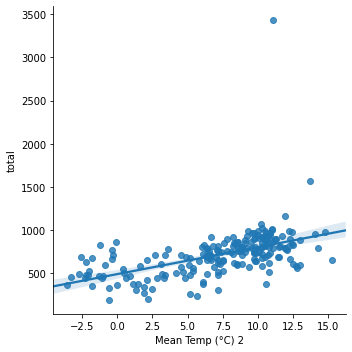

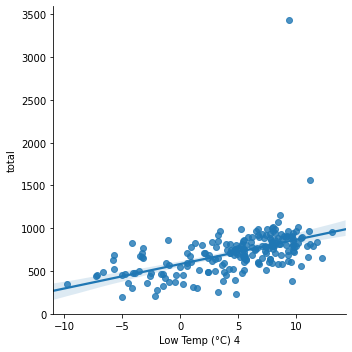

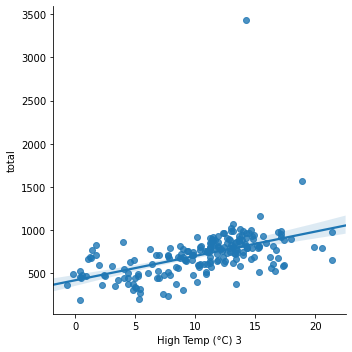

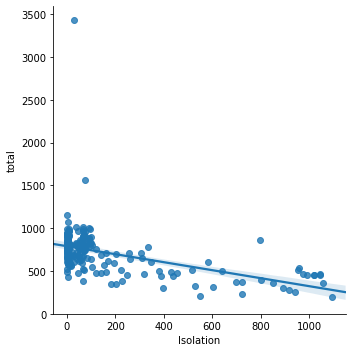

In [26]:
sns.lmplot(y='total',x='Mean Temp (°C) 2',data=vis)
sns.lmplot(y='total',x='Low Temp (°C) 4',data=vis)
sns.lmplot(y='total',x='High Temp (°C) 3',data=vis)
sns.lmplot(y='total',x='Isolation',data=vis)

<AxesSubplot:xlabel='day of week', ylabel='total'>

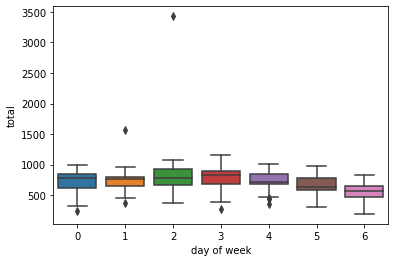

In [27]:
sns.boxplot(y='total',x='day of week',data=vis)

## Data Processing

In [28]:
df.head()

,alabama,alabama lítil,avócadó,bergtoppur stórógarberja,caffe latte,cappucino,chango,chango lítil,chickencado,chickencado lítil,chickencurry,chickencurry lítil,coke,coke lite,coke zero,dazed,dazed lítil,django,django lítil,elvis,elvis lítil,engiferskot,espresso,gjafabréf,good times,good times lítil,greenday,greenday lítil,hafragrautur með eplum,hafragrautur með granóla,hangover,hangover lítil,hawaiian flirt,hawaiian flirt lítil,honey bunny,honey bunny lítil,icelandic flirt,icelandic flirt lítil,indian flirt,indian flirt lítil,jj,jj lítil,kaffi,kaffi curro,kaffi curro lítil,kaffi frappó,kaffi frappó lítil,kjöt,lotta love,lotta love lítil,lítil poki,lítil samloka,macchiato,meatlove,meatlove lítil,mocha,mozarella,mozzato,mozzato lítil,mr. blonde,mr. blonde lítil,mr. pink,mr. pink lítil,nice guy,nice guy lítil,parmella,parmella lítil,pescado,pescado lítil,presley,presley lítil,próteinduft,ruðrófuskot,spanish flirt,spanish flirt lítil,spicy chicken,spicy chicken lítil,spicy tuna,spicy tuna lítil,spicy vegan,spicy vegan lítil,stór poki,toppur appelsínu,toppur epla,toppur ferstórju,toppur kolsýrt vatn,tunacado,tunacado lítil,túmerikskot,vanilla flirt,vanilla flirt lítil,vatn 330 ml,winston wolf,winston wolf lítil,total,day of week,Daily Total,Isolation,Mean Temp (°C) 2,High Temp (°C) 3,Low Temp (°C) 4,Precipitation (mm),Snow Depth,snjóhula (0-4),Sunlight Hours (klst),Mean Wind (m/s),Max Wind (m/s),Gust (m/s)
2020-02-28,3,1,0,1,3,0,24,4,125,5,0,0,3,0,1,1,1,6,0,25,7,0,0,0,26,6,2,0,0,0,15,0,1,0,10,1,6,3,2,0,13,0,0,0,0,0,0,1,10,1,27,14,0,0,0,0,0,7,1,17,1,2.0,0,111,11,27,8,20,2,18,7,0,0,0,0,60,16,18,4,15,0,0,0,0,0,1,9,3,0,2,1,1,3,0,713.0,4,1.0,1.0,-0.3,1.7,-3.3,5.0,9.0,4.0,1.0,4.1,13.5,22.8
2020-02-29,11,1,0,0,4,0,34,0,78,10,0,0,0,0,8,2,0,7,2,33,1,0,0,0,19,4,2,0,2,0,16,0,0,3,6,0,8,1,0,0,13,2,10,2,1,0,0,0,12,1,10,23,0,0,0,0,0,5,1,5,0,1.0,0,106,15,13,5,8,3,18,6,0,0,0,0,87,12,9,0,8,0,0,0,0,0,0,20,0,0,3,1,1,4,2,659.0,5,0.0,1.0,-0.4,1.1,-3.3,0.4,8.0,4.0,0.0,2.0,5.2,8.9
2020-03-01,1,1,0,0,0,0,15,0,38,6,0,0,5,0,2,4,2,7,1,10,0,0,0,0,18,2,2,1,0,0,10,0,2,0,1,1,5,1,0,0,10,1,2,0,0,0,0,0,8,0,16,17,0,0,0,0,0,3,1,4,1,0.0,1,64,6,10,3,20,2,24,2,0,0,0,0,58,14,6,0,6,0,0,0,0,0,0,3,0,0,4,3,0,0,0,424.0,6,3.0,4.0,2.1,3.6,-1.3,2.4,9.0,4.0,0.0,6.9,10.6,18.2
2020-03-02,2,1,0,0,2,0,30,1,66,10,0,0,1,0,2,4,0,2,2,24,3,0,0,0,9,0,3,0,1,0,6,2,3,1,4,2,9,0,4,1,7,1,0,0,2,0,0,3,10,0,17,12,0,0,0,0,0,2,2,12,0,1.0,0,104,11,22,4,16,3,17,4,0,0,0,0,92,9,12,0,9,0,0,0,0,0,0,10,8,0,1,0,0,2,0,588.0,0,6.0,10.0,1.6,3.1,0.6,0.0,5.0,4.0,2.0,8.0,11.4,18.4
2020-03-03,8,3,0,0,0,0,39,2,51,4,0,0,2,0,3,6,0,5,2,8,2,0,1,-1,17,8,4,0,1,0,5,1,2,0,6,0,3,2,1,0,12,1,1,0,1,0,0,1,5,2,14,12,1,0,0,0,0,5,4,8,0,5.0,1,111,8,15,7,6,2,15,5,0,0,0,0,96,10,22,2,15,3,0,0,1,0,1,5,2,0,3,0,0,2,0,589.0,1,5.0,15.0,-0.9,2.0,-1.2,0.0,5.0,4.0,0.2,3.1,7.1,13.0


## Target Data for Prediction

In [29]:
targets = list(prodList.values())
len(targets)

94

In [116]:
shift_days = 3

In [117]:
df_targets = df[targets].shift(-shift_days)

In [118]:
df[targets].head(shift_days+5)

,chango,chickencado,chickencurry,hangover,mozzato,parmella,pescado,spicy chicken,spicy tuna,spicy vegan,tunacado,lítil samloka,chango lítil,chickencado lítil,chickencurry lítil,hangover lítil,mozzato lítil,parmella lítil,pescado lítil,spicy chicken lítil,spicy tuna lítil,spicy vegan lítil,tunacado lítil,alabama,dazed,django,elvis,good times,greenday,hawaiian flirt,honey bunny,icelandic flirt,indian flirt,jj,kaffi curro,kaffi frappó,lotta love,mr. blonde,mr. pink,nice guy,presley,spanish flirt,vanilla flirt,winston wolf,alabama lítil,dazed lítil,django lítil,elvis lítil,good times lítil,greenday lítil,hawaiian flirt lítil,honey bunny lítil,icelandic flirt lítil,indian flirt lítil,jj lítil,kaffi curro lítil,kaffi frappó lítil,lotta love lítil,mr. blonde lítil,mr. pink lítil,nice guy lítil,presley lítil,spanish flirt lítil,vanilla flirt lítil,winston wolf lítil,espresso,cappucino,caffe latte,macchiato,mocha,kaffi,túmerikskot,ruðrófuskot,engiferskot,hafragrautur með eplum,hafragrautur með granóla,kjöt,avócadó,mozarella,próteinduft,bergtoppur stórógarberja,coke,coke lite,coke zero,gjafabréf,lítil poki,stór poki,toppur appelsínu,toppur epla,toppur ferstórju,toppur kolsýrt vatn,vatn 330 ml,meatlove,meatlove lítil
2020-02-28,24,125,0,15,7,27,20,60,18,15,9,14,4,5,0,0,1,8,2,16,4,0,3,3,1,6,25,26,2,1,10,6,2,13,0,0,10,17,2.0,111,18,0,2,3,1,1,0,7,6,0,0,1,3,0,0,0,0,1,1,0,11,7,0,1,0,0,0,3,0,0,0,0,0,0,0,0,1,0,0,0,1,3,0,1,0,27,0,0,0,0,1,1,0,0
2020-02-29,34,78,0,16,5,13,8,87,9,8,20,23,0,10,0,0,1,5,3,12,0,0,0,11,2,7,33,19,2,0,6,8,0,13,2,0,12,5,1.0,106,18,0,3,4,1,0,2,1,4,0,3,0,1,0,2,1,0,1,0,0,15,6,0,1,2,0,0,4,0,0,10,0,0,0,2,0,0,0,0,0,0,0,0,8,0,10,0,0,0,0,0,1,0,0
2020-03-01,15,38,0,10,3,10,20,58,6,6,3,17,0,6,0,0,1,3,2,14,0,0,0,1,4,7,10,18,2,2,1,5,0,10,0,0,8,4,0.0,64,24,0,4,0,1,2,1,0,2,1,0,1,1,0,1,0,0,0,1,1,6,2,0,3,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,5,0,2,0,16,0,0,0,0,0,0,0,0
2020-03-02,30,66,0,6,2,22,16,92,12,9,10,12,1,10,0,2,2,4,3,9,0,0,8,2,4,2,24,9,3,3,4,9,4,7,0,0,10,12,1.0,104,17,0,1,2,1,0,2,3,0,0,1,2,0,1,1,2,0,0,0,0,11,4,0,0,0,0,0,2,0,0,0,0,0,0,1,0,3,0,0,0,0,1,0,2,0,17,0,0,0,0,0,0,0,0
2020-03-03,39,51,0,5,5,15,6,96,22,15,5,12,2,4,0,1,4,7,2,10,2,3,2,8,6,5,8,17,4,2,6,3,1,12,0,0,5,8,5.0,111,15,0,3,2,3,0,2,2,8,0,0,0,2,0,1,1,0,2,0,1,8,5,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,2,0,3,-1,14,0,0,1,0,1,0,0,0
2020-03-04,30,58,0,5,8,27,19,113,20,10,12,8,3,7,0,0,0,6,4,19,4,5,0,8,1,10,14,26,0,1,4,4,3,14,0,0,15,7,0.0,119,21,0,1,3,1,0,4,3,2,0,0,1,0,0,0,0,0,3,0,1,13,7,0,2,0,0,0,4,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,1,0,15,0,4,0,0,1,0,0,0
2020-03-05,49,99,0,14,14,20,18,101,10,7,22,34,5,17,0,2,6,3,6,19,2,1,4,9,5,6,26,18,8,0,4,8,3,8,1,0,15,8,5.0,123,21,0,4,8,3,2,1,8,7,0,0,1,0,0,3,1,0,0,1,0,15,6,0,0,0,1,0,5,0,1,1,0,0,0,0,0,0,0,0,0,1,2,0,1,-2,27,0,2,2,0,3,2,0,0
2020-03-06,50,89,0,10,8,15,19,89,13,13,5,29,1,8,0,4,7,3,5,9,1,1,1,4,2,2,19,22,0,1,7,10,2,11,1,0,6,9,4.0,98,29,0,4,0,0,2,2,1,5,0,0,0,4,0,0,0,0,1,4,0,13,9,0,1,1,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,1,4,0,3,-2,18,0,0,0,0,2,0,0,0


In [119]:
df_targets.head(5)

,chango,chickencado,chickencurry,hangover,mozzato,parmella,pescado,spicy chicken,spicy tuna,spicy vegan,tunacado,lítil samloka,chango lítil,chickencado lítil,chickencurry lítil,hangover lítil,mozzato lítil,parmella lítil,pescado lítil,spicy chicken lítil,spicy tuna lítil,spicy vegan lítil,tunacado lítil,alabama,dazed,django,elvis,good times,greenday,hawaiian flirt,honey bunny,icelandic flirt,indian flirt,jj,kaffi curro,kaffi frappó,lotta love,mr. blonde,mr. pink,nice guy,presley,spanish flirt,vanilla flirt,winston wolf,alabama lítil,dazed lítil,django lítil,elvis lítil,good times lítil,greenday lítil,hawaiian flirt lítil,honey bunny lítil,icelandic flirt lítil,indian flirt lítil,jj lítil,kaffi curro lítil,kaffi frappó lítil,lotta love lítil,mr. blonde lítil,mr. pink lítil,nice guy lítil,presley lítil,spanish flirt lítil,vanilla flirt lítil,winston wolf lítil,espresso,cappucino,caffe latte,macchiato,mocha,kaffi,túmerikskot,ruðrófuskot,engiferskot,hafragrautur með eplum,hafragrautur með granóla,kjöt,avócadó,mozarella,próteinduft,bergtoppur stórógarberja,coke,coke lite,coke zero,gjafabréf,lítil poki,stór poki,toppur appelsínu,toppur epla,toppur ferstórju,toppur kolsýrt vatn,vatn 330 ml,meatlove,meatlove lítil
2020-02-28,30.0,66.0,0.0,6.0,2.0,22.0,16.0,92.0,12.0,9.0,10.0,12.0,1.0,10.0,0.0,2.0,2.0,4.0,3.0,9.0,0.0,0.0,8.0,2.0,4.0,2.0,24.0,9.0,3.0,3.0,4.0,9.0,4.0,7.0,0.0,0.0,10.0,12.0,1.0,104.0,17.0,0.0,1.0,2.0,1.0,0.0,2.0,3.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,11.0,4.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-29,39.0,51.0,0.0,5.0,5.0,15.0,6.0,96.0,22.0,15.0,5.0,12.0,2.0,4.0,0.0,1.0,4.0,7.0,2.0,10.0,2.0,3.0,2.0,8.0,6.0,5.0,8.0,17.0,4.0,2.0,6.0,3.0,1.0,12.0,0.0,0.0,5.0,8.0,5.0,111.0,15.0,0.0,3.0,2.0,3.0,0.0,2.0,2.0,8.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,2.0,0.0,1.0,8.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,3.0,-1.0,14.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2020-03-01,30.0,58.0,0.0,5.0,8.0,27.0,19.0,113.0,20.0,10.0,12.0,8.0,3.0,7.0,0.0,0.0,0.0,6.0,4.0,19.0,4.0,5.0,0.0,8.0,1.0,10.0,14.0,26.0,0.0,1.0,4.0,4.0,3.0,14.0,0.0,0.0,15.0,7.0,0.0,119.0,21.0,0.0,1.0,3.0,1.0,0.0,4.0,3.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,1.0,13.0,7.0,0.0,2.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,15.0,0.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0
2020-03-02,49.0,99.0,0.0,14.0,14.0,20.0,18.0,101.0,10.0,7.0,22.0,34.0,5.0,17.0,0.0,2.0,6.0,3.0,6.0,19.0,2.0,1.0,4.0,9.0,5.0,6.0,26.0,18.0,8.0,0.0,4.0,8.0,3.0,8.0,1.0,0.0,15.0,8.0,5.0,123.0,21.0,0.0,4.0,8.0,3.0,2.0,1.0,8.0,7.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,0.0,0.0,1.0,0.0,15.0,6.0,0.0,0.0,0.0,1.0,0.0,5.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,-2.0,27.0,0.0,2.0,2.0,0.0,3.0,2.0,0.0,0.0
2020-03-03,50.0,89.0,0.0,10.0,8.0,15.0,19.0,89.0,13.0,13.0,5.0,29.0,1.0,8.0,0.0,4.0,7.0,3.0,5.0,9.0,1.0,1.0,1.0,4.0,2.0,2.0,19.0,22.0,0.0,1.0,7.0,10.0,2.0,11.0,1.0,0.0,6.0,9.0,4.0,98.0,29.0,0.0,4.0,0.0,0.0,2.0,2.0,1.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,13.0,9.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,0.0,3.0,-2.0,18.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0


In [120]:
df_targets.tail()

,chango,chickencado,chickencurry,hangover,mozzato,parmella,pescado,spicy chicken,spicy tuna,spicy vegan,tunacado,lítil samloka,chango lítil,chickencado lítil,chickencurry lítil,hangover lítil,mozzato lítil,parmella lítil,pescado lítil,spicy chicken lítil,spicy tuna lítil,spicy vegan lítil,tunacado lítil,alabama,dazed,django,elvis,good times,greenday,hawaiian flirt,honey bunny,icelandic flirt,indian flirt,jj,kaffi curro,kaffi frappó,lotta love,mr. blonde,mr. pink,nice guy,presley,spanish flirt,vanilla flirt,winston wolf,alabama lítil,dazed lítil,django lítil,elvis lítil,good times lítil,greenday lítil,hawaiian flirt lítil,honey bunny lítil,icelandic flirt lítil,indian flirt lítil,jj lítil,kaffi curro lítil,kaffi frappó lítil,lotta love lítil,mr. blonde lítil,mr. pink lítil,nice guy lítil,presley lítil,spanish flirt lítil,vanilla flirt lítil,winston wolf lítil,espresso,cappucino,caffe latte,macchiato,mocha,kaffi,túmerikskot,ruðrófuskot,engiferskot,hafragrautur með eplum,hafragrautur með granóla,kjöt,avócadó,mozarella,próteinduft,bergtoppur stórógarberja,coke,coke lite,coke zero,gjafabréf,lítil poki,stór poki,toppur appelsínu,toppur epla,toppur ferstórju,toppur kolsýrt vatn,vatn 330 ml,meatlove,meatlove lítil
2020-09-20,23.0,105.0,0.0,13.0,5.0,19.0,25.0,93.0,23.0,11.0,16.0,11.0,2.0,7.0,0.0,2.0,1.0,7.0,2.0,22.0,3.0,2.0,3.0,21.0,2.0,7.0,31.0,18.0,3.0,9.0,3.0,10.0,4.0,18.0,3.0,0.0,24.0,12.0,1.0,78.0,31.0,0.0,5.0,2.0,4.0,0.0,2.0,6.0,4.0,1.0,1.0,2.0,1.0,0.0,5.0,0.0,0.0,1.0,1.0,0.0,15.0,7.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,0.0,5.0,-2.0,29.0,0.0,0.0,2.0,0.0,3.0,0.0,5.0,2.0
2020-09-21,20.0,49.0,0.0,4.0,3.0,13.0,4.0,38.0,17.0,4.0,5.0,5.0,1.0,8.0,0.0,1.0,2.0,6.0,1.0,108.0,4.0,0.0,1.0,21.0,3.0,9.0,8.0,25.0,4.0,1.0,2.0,2.0,3.0,11.0,0.0,0.0,6.0,5.0,1.0,26.0,20.0,0.0,1.0,0.0,2.0,1.0,1.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,9.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0
2020-09-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-09-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-09-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Convert to NumPy Arrays

In [121]:
X = df.values[0:-shift_days]

In [122]:
print(type(X))
print("Shape", X.shape)

<class 'numpy.ndarray'>
Shape (200, 108)


In [123]:
y = df_targets.values[:-shift_days]

In [124]:
print(type(y))
print("Shape", y.shape)

<class 'numpy.ndarray'>
Shape (200, 94)


Number of observations

In [125]:
num_data = len(X)
num_data

200

Fraction of the data-set that will be sued for the training-set

In [126]:
train_split = 0.9

Number of observations in the training-set

In [127]:
num_train = int(train_split * num_data)
num_train

180

Number of observations in the test-set

In [128]:
num_test = num_data - num_train
num_test

20

Split the train and test set

In [129]:
X_train = X[0:num_train]
X_test = X[num_train:]
len(X_train) + len(X_test)

200

In [130]:
y_train = y[0:num_train]
y_test = y[num_train:]
len(y_train) + len(y_test)

200

Number of signals

In [131]:
num_x_signals = X.shape[1]
num_y_signals = y.shape[1]

## Scale Data

In [132]:
from sklearn.preprocessing import MinMaxScaler

In [133]:
x_scaler = MinMaxScaler()

In [134]:
X_train_scaled = x_scaler.fit_transform(X_train)
X_test_scaled = x_scaler.transform(X_test)

In [135]:
y_scaler = MinMaxScaler()

In [136]:
y_train_scaled = y_scaler.fit_transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

## Data Generator

In [137]:
def batch_generator(batch_size, sequence_length):
    """
    Generator function for creating random batches of training-data.
    """

    # Infinite loop.
    while True:
        # Allocate a new array for the batch of input-signals.
        x_shape = (batch_size, sequence_length, num_x_signals)
        x_batch = np.zeros(shape=x_shape, dtype=np.float16)

        # Allocate a new array for the batch of output-signals.
        y_shape = (batch_size, sequence_length, num_y_signals)
        y_batch = np.zeros(shape=y_shape, dtype=np.float16)

        # Fill the batch with random sequences of data.
        for i in range(batch_size):
            # Get a random start-index.
            # This points somewhere into the training-data.
            idx = np.random.randint(num_train - sequence_length)
            
            # Copy the sequences of data starting at this index.
            x_batch[i] = X_train_scaled[idx:idx+sequence_length]
            y_batch[i] = y_train_scaled[idx:idx+sequence_length]
        
        yield (x_batch, y_batch)

In [138]:
batch_size = 256

In [139]:
sequence_length = 7 * 2
sequence_length

14

In [140]:
generator = batch_generator(batch_size=batch_size,
                            sequence_length=sequence_length)

In [141]:
x_batch, y_batch = next(generator)

In [142]:
print(x_batch.shape)
print(y_batch.shape)

(256, 14, 108)
(256, 14, 94)


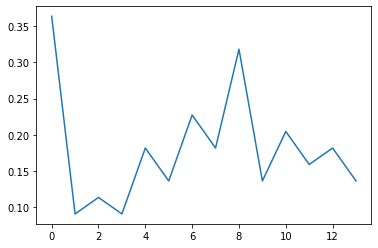

In [143]:
batch = 0   # First sequence in the batch.
signal = 0  # First signal from the 20 input-signals.
seq = x_batch[batch, :, signal]
plt.plot(seq)

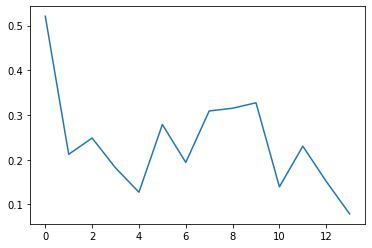

In [144]:
seq = y_batch[batch, :, signal]
plt.plot(seq)

### Validation Set

In [145]:
validation_data = (np.expand_dims(X_test_scaled, axis=0),
                   np.expand_dims(y_test_scaled, axis=0))

# Create RNN

In [146]:
import tensorflow as tf
from tensorflow import keras


from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Input, Dense, GRU, Embedding
from tensorflow.python.keras.optimizers import RMSprop
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau

In [147]:
model = Sequential()

In [148]:
model.add(GRU(units=150,
              return_sequences=True,
              input_shape=(None, num_x_signals,)))

In [149]:
model.add(Dense(num_y_signals, activation='sigmoid'))

In [150]:
if False:
    from tensorflow.python.keras.initializers import RandomUniform

    # Maybe use lower init-ranges.
    init = RandomUniform(minval=-0.05, maxval=0.05)

    model.add(Dense(num_y_signals,
                    activation='linear',
                    kernel_initializer=init))

### Loss Function

In [151]:
warmup_steps = 3

In [152]:
def loss_mse_warmup(y_true, y_pred):
    """
    Calculate the Mean Squared Error between y_true and y_pred,
    but ignore the beginning "warmup" part of the sequences.
    
    y_true is the desired output.
    y_pred is the model's output.
    """

    # The shape of both input tensors are:
    # [batch_size, sequence_length, num_y_signals].

    # Ignore the "warmup" parts of the sequences
    # by taking slices of the tensors.
    y_true_slice = y_true[:, warmup_steps:, :]
    y_pred_slice = y_pred[:, warmup_steps:, :]

    # These sliced tensors both have this shape:
    # [batch_size, sequence_length - warmup_steps, num_y_signals]

    # Calculate the MSE loss for each value in these tensors.
    # This outputs a 3-rank tensor of the same shape.
    loss = tf.losses.mean_squared_error(labels=y_true_slice,
                                        predictions=y_pred_slice)

    # Keras may reduce this across the first axis (the batch)
    # but the semantics are unclear, so to be sure we use
    # the loss across the entire tensor, we reduce it to a
    # single scalar with the mean function.
    loss_mean = tf.reduce_mean(loss)

    return loss_mean

### Complie Model

In [153]:
optimizer = RMSprop(lr=1e-3)

In [154]:
model.compile(loss=loss_mse_warmup, optimizer=optimizer)

In [155]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_1 (GRU)                  (None, None, 150)         116550    
_________________________________________________________________
dense_1 (Dense)              (None, None, 94)          14194     
Total params: 130,744
Trainable params: 130,744
Non-trainable params: 0
_________________________________________________________________


### Callback Functions

In [156]:
path_checkpoint = '23_checkpoint.keras'
callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                      monitor='val_loss',
                                      verbose=1,
                                      save_weights_only=True,
                                      save_best_only=True)

In [157]:
callback_early_stopping = EarlyStopping(monitor='val_loss',
                                        patience=5, verbose=1)

In [158]:
callback_tensorboard = TensorBoard(log_dir='./23_logs/',
                                   histogram_freq=0,
                                   write_graph=False)

In [159]:
callback_reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                       factor=0.1,
                                       min_lr=1e-4,
                                       patience=0,
                                       verbose=1)

In [160]:
callbacks = [callback_early_stopping,
             callback_checkpoint,
             callback_tensorboard,
             callback_reduce_lr]

## Train the RNN

In [161]:
%%time
model.fit_generator(generator=generator,
                    epochs=20,
                    steps_per_epoch=100,
                    validation_data=validation_data,
                    callbacks=callbacks)

Epoch 1/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0336
Epoch 00001: val_loss improved from inf to 0.03303, saving model to 23_checkpoint.keras
100/100 [==============================] - 18s 178ms/step - loss: 0.0335 - val_loss: 0.0330
Epoch 2/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0235
Epoch 00002: val_loss did not improve from 0.03303

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
100/100 [==============================] - 16s 157ms/step - loss: 0.0234 - val_loss: 0.0349
Epoch 3/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0193
Epoch 00003: val_loss did not improve from 0.03303

Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0001.
100/100 [==============================] - 14s 141ms/step - loss: 0.0192 - val_loss: 0.0350
Epoch 4/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0178
Epoch 00004: val_loss did not improve from 0.03303
100/100 [==================

Performance

In [162]:
result = model.evaluate(x=np.expand_dims(X_test_scaled, axis=0),
                        y=np.expand_dims(y_test_scaled, axis=0))

1/1 [==============================] - 0s 136ms/sample - loss: 0.0371


In [163]:
print("loss (test-set):", result)

loss (test-set): 0.03710600733757019


In [164]:
if False:
    for res, metric in zip(result, model.metrics_names):
        print("{0}: {1:.3e}".format(metric, res))

In [165]:
loss_df = pd.DataFrame(model.history.history)

In [166]:
#loss_df.plot()

In [167]:
def plot_comparison(start_idx, length=100, train=True):
    """
    Plot the predicted and true output-signals.
    
    :param start_idx: Start-index for the time-series.
    :param length: Sequence-length to process and plot.
    :param train: Boolean whether to use training- or test-set.
    """
    
    if train:
        # Use training-data.
        x = X_train_scaled
        y_true = y_train
    else:
        # Use test-data.
        x = X_test_scaled
        y_true = y_test
    
    # End-index for the sequences.
    end_idx = start_idx + length
    
    # Select the sequences from the given start-index and
    # of the given length.
    x = x[start_idx:end_idx]
    y_true = y_true[start_idx:end_idx]
    
    # Input-signals for the model.
    x = np.expand_dims(x, axis=0)

    # Use the model to predict the output-signals.
    y_pred = model.predict(x)
    
    # The output of the model is between 0 and 1.
    # Do an inverse map to get it back to the scale
    # of the original data-set.
    y_pred_rescaled = y_scaler.inverse_transform(y_pred[0])
    
    # For each output-signal.
    for signal in range(len(targets)):
        # Get the output-signal predicted by the model.
        signal_pred = y_pred_rescaled[:, signal]
        
        # Get the true output-signal from the data-set.
        signal_true = y_true[:, signal]

        # Make the plotting-canvas bigger.
        plt.figure(figsize=(15,5))
        
        # Plot and compare the two signals.
        plt.plot(signal_true, label='true')
        plt.plot(signal_pred, label='pred')
        
        # Plot grey box for warmup-period.
        p = plt.axvspan(0, warmup_steps, facecolor='black', alpha=0.15)
        
        # Plot labels etc.
        plt.ylabel(targets[signal])
        plt.legend()
        plt.show()

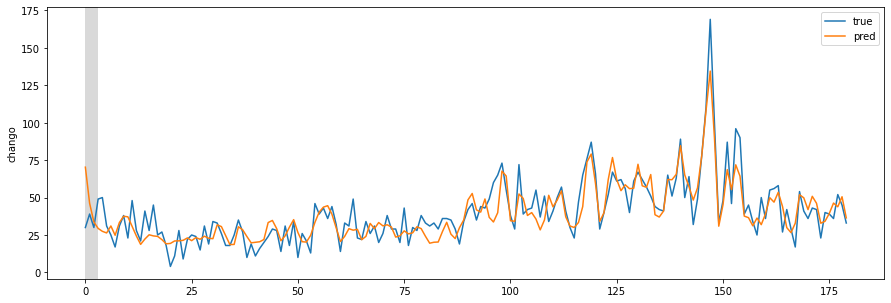

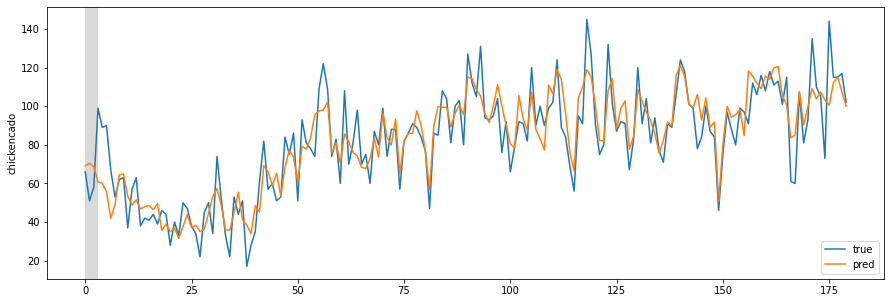

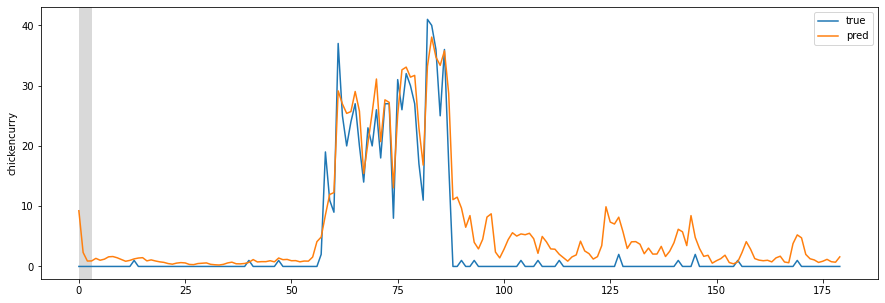

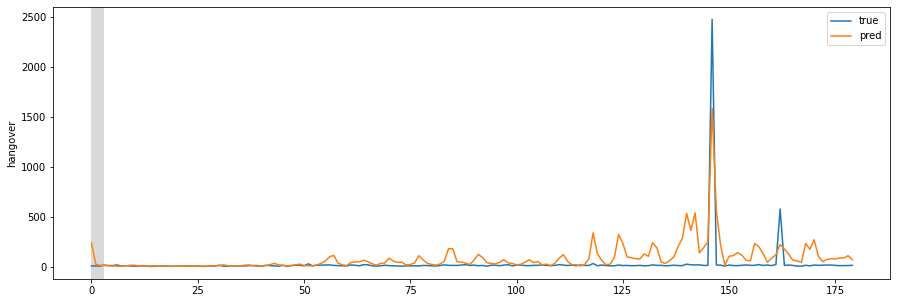

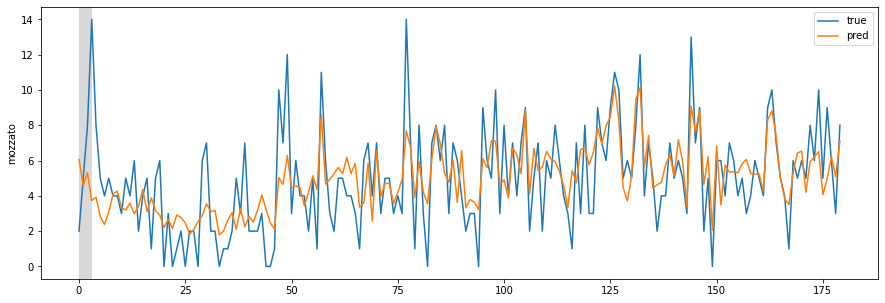

...

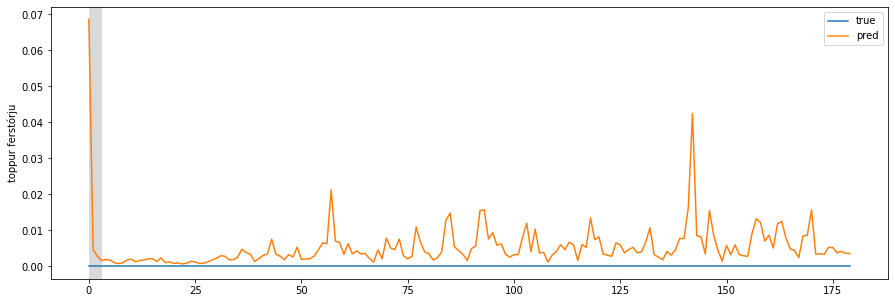

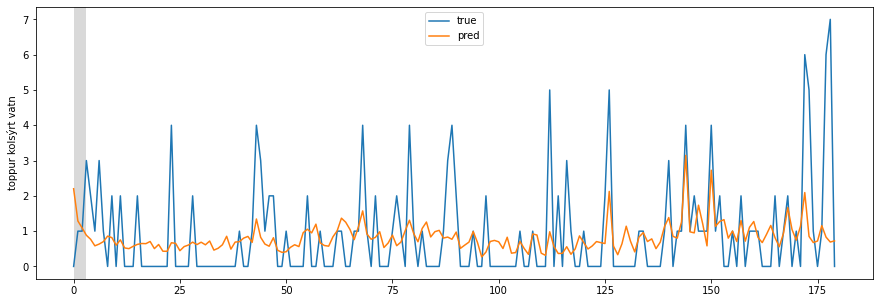

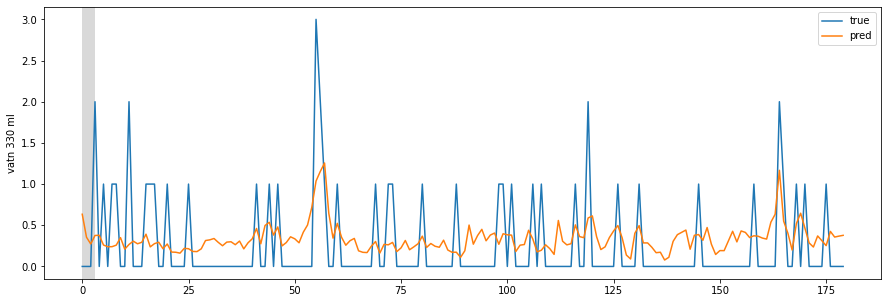

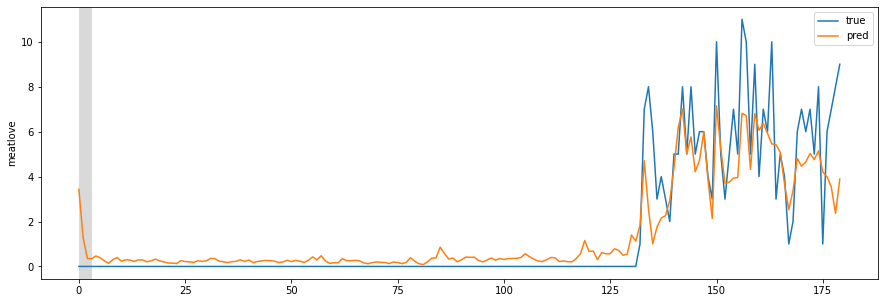

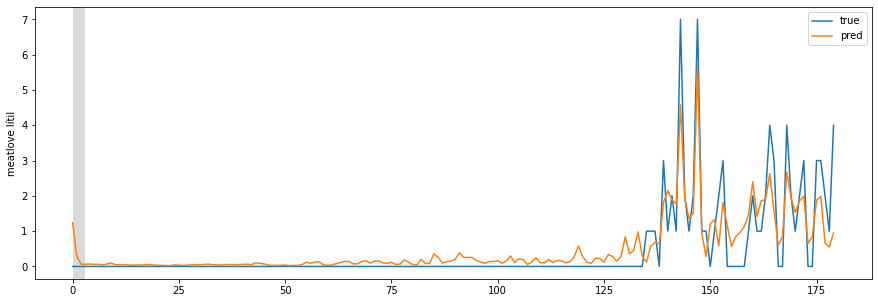

In [168]:
plot_comparison(start_idx=0, length=10000, train=True)

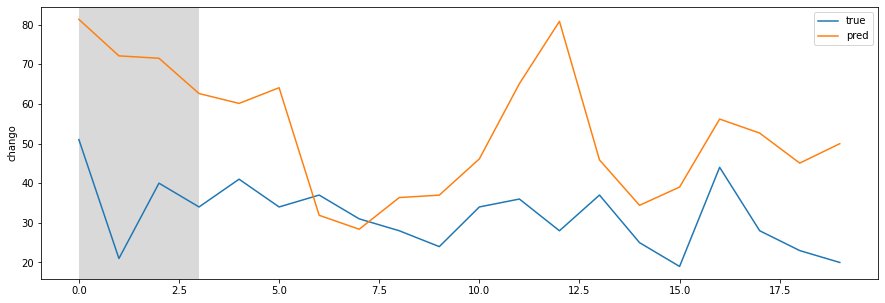

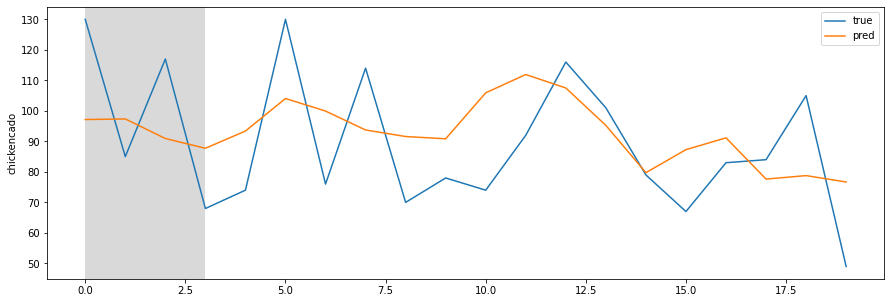

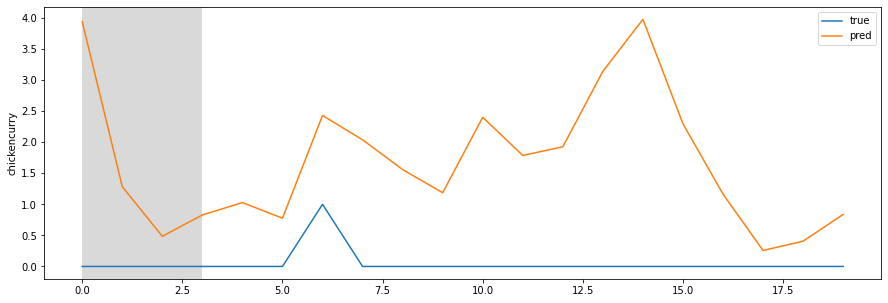

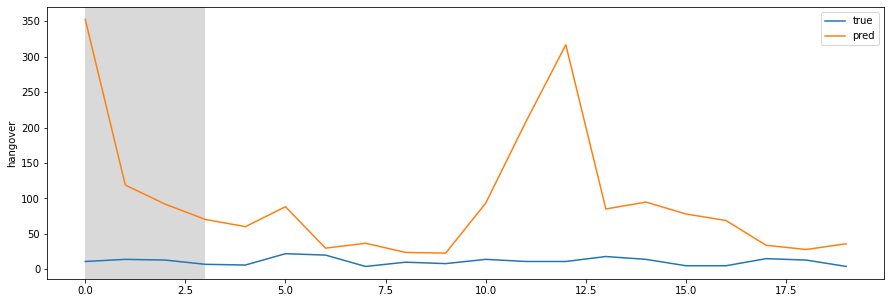

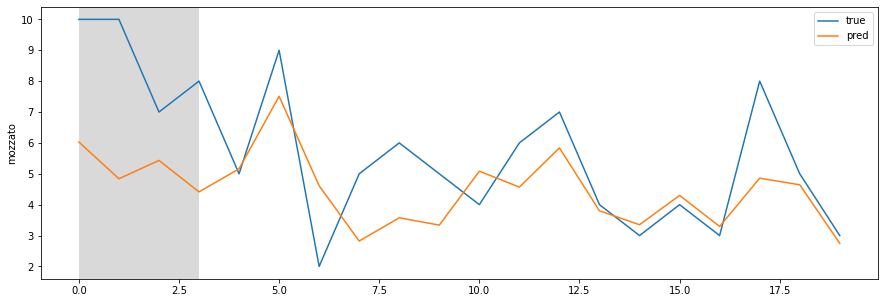

...

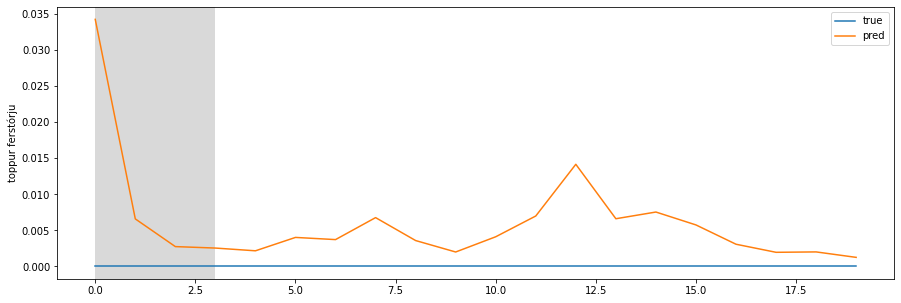

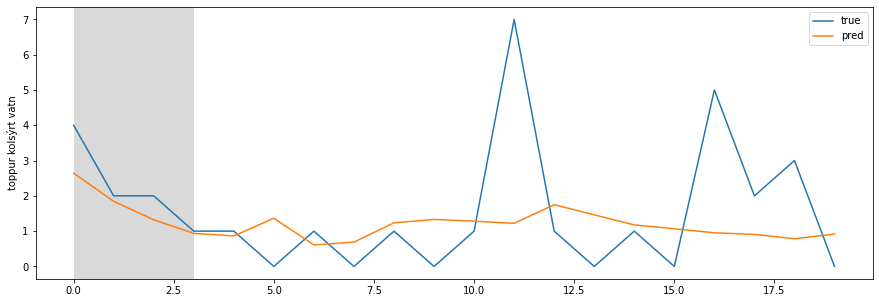

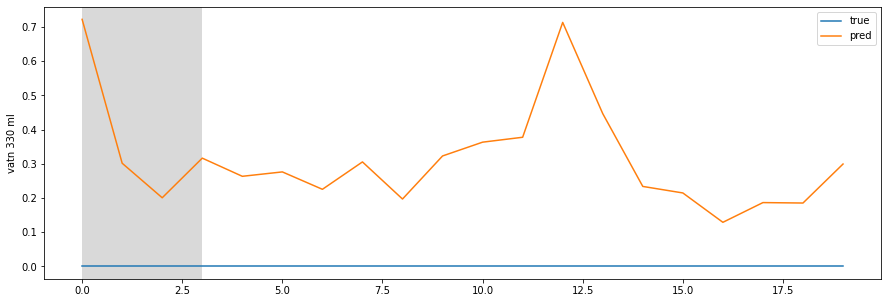

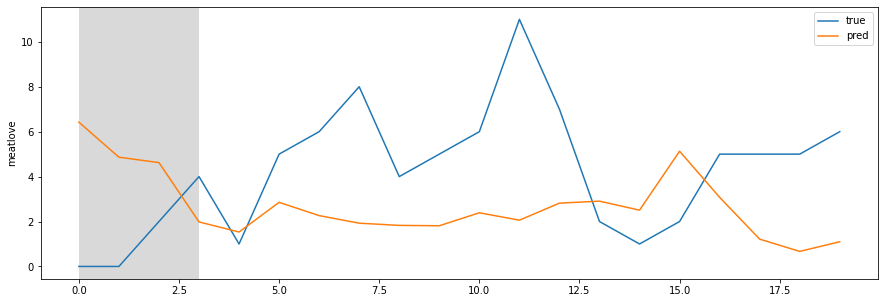

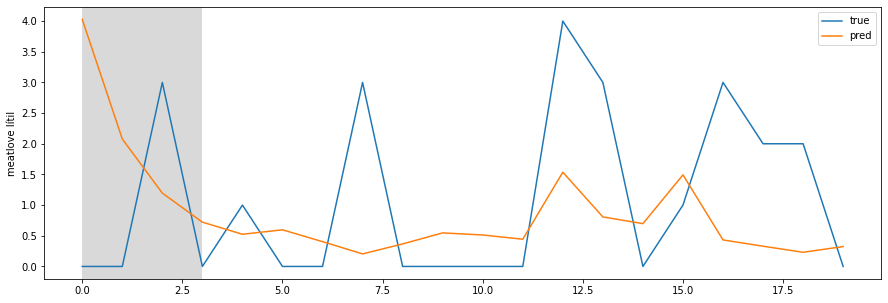

In [169]:
plot_comparison(start_idx=0, length=10000, train=False)

## RMS error

In [170]:
start_idx=0
length=10000

In [171]:
# Use test-data.
x = X_test_scaled
y_true = y_test

# End-index for the sequences.
end_idx = start_idx + length
    
# Select the sequences from the given start-index and
# of the given length.
x = x[start_idx:end_idx]
y_true = y_true[start_idx:end_idx]
    
# Input-signals for the model.
x = np.expand_dims(x, axis=0)

# Use the model to predict the output-signals.
y_pred = model.predict(x)
    
# The output of the model is between 0 and 1.
# Do an inverse map to get it back to the scale
# of the original data-set.
y_pred_rescaled = y_scaler.inverse_transform(y_pred[0])

In [172]:
np.max(y_true)

130.0

In [173]:
np.min(y_true)

-4.0

In [174]:
np.mean(y_true)

7.746755319148936

In [175]:
RMS = np.sqrt((y_pred_rescaled-y_true)**2)
np.mean(RMS)

4.2507030529195955

In [176]:
np.max(RMS)

341.6089782714844

In [177]:
np.min(RMS)

0.0012585222721099854

In [99]:
df.tail()

,alabama,alabama lítil,avócadó,bergtoppur stórógarberja,caffe latte,cappucino,chango,chango lítil,chickencado,chickencado lítil,chickencurry,chickencurry lítil,coke,coke lite,coke zero,dazed,dazed lítil,django,django lítil,elvis,elvis lítil,engiferskot,espresso,gjafabréf,good times,good times lítil,greenday,greenday lítil,hafragrautur með eplum,hafragrautur með granóla,hangover,hangover lítil,hawaiian flirt,hawaiian flirt lítil,honey bunny,honey bunny lítil,icelandic flirt,icelandic flirt lítil,indian flirt,indian flirt lítil,jj,jj lítil,kaffi,kaffi curro,kaffi curro lítil,kaffi frappó,kaffi frappó lítil,kjöt,lotta love,lotta love lítil,lítil poki,lítil samloka,macchiato,meatlove,meatlove lítil,mocha,mozarella,mozzato,mozzato lítil,mr. blonde,mr. blonde lítil,mr. pink,mr. pink lítil,nice guy,nice guy lítil,parmella,parmella lítil,pescado,pescado lítil,presley,presley lítil,próteinduft,ruðrófuskot,spanish flirt,spanish flirt lítil,spicy chicken,spicy chicken lítil,spicy tuna,spicy tuna lítil,spicy vegan,spicy vegan lítil,stór poki,toppur appelsínu,toppur epla,toppur ferstórju,toppur kolsýrt vatn,tunacado,tunacado lítil,túmerikskot,vanilla flirt,vanilla flirt lítil,vatn 330 ml,winston wolf,winston wolf lítil,total,day of week,Daily Total,Isolation,Mean Temp (°C) 2,High Temp (°C) 3,Low Temp (°C) 4,Precipitation (mm),Snow Depth,snjóhula (0-4),Sunlight Hours (klst),Mean Wind (m/s),Max Wind (m/s),Gust (m/s)
2020-09-20,9,1,0,0,1,0,19,0,67,8,0,0,1,0,2,5,0,4,1,17,5,0,0,-1,14,2,4,0,0,0,5,0,1,0,6,3,5,4,4,3,9,1,3,0,0,0,0,0,12,1,15,14,0,2,1,0,0,4,0,9,1,5.0,1,54,6,16,10,25,2,25,5,0,0,0,0,39,13,19,1,15,2,0,0,0,0,0,8,1,0,1,0,0,1,0,511.0,6,30.0,224.0,7.2,10.9,5.5,4.7,0.0,0.0,0.8,6.4,15.0,23.1
2020-09-21,31,0,0,0,3,0,44,0,83,4,0,0,1,0,4,4,3,7,1,17,5,0,2,-1,19,4,2,0,1,0,5,0,2,0,12,1,8,2,2,0,15,7,5,0,2,0,0,0,17,1,31,7,0,5,3,0,0,3,6,9,1,4.0,0,44,14,23,5,19,1,37,6,0,0,0,0,71,22,44,3,2,3,0,2,0,0,5,12,6,0,4,0,0,2,0,707.0,0,37.0,259.0,4.5,7.7,2.1,5.1,0.0,0.0,6.0,5.5,9.9,18.9
2020-09-22,34,1,0,0,0,0,28,0,84,4,0,0,0,0,6,6,1,5,0,16,4,0,2,-1,25,5,4,0,0,0,15,0,4,0,11,3,6,1,0,0,16,1,2,0,1,0,0,0,19,0,30,7,0,5,2,0,0,8,4,16,0,1.0,1,57,11,25,4,22,4,27,4,0,0,0,0,76,11,45,0,13,2,0,0,0,0,2,12,3,0,8,0,0,3,0,706.0,1,56.0,305.0,3.4,7.0,2.0,3.6,0.0,0.0,5.8,2.5,6.9,12.6
2020-09-23,21,4,0,0,0,0,23,2,105,7,0,0,3,0,5,2,0,7,2,31,6,0,1,-2,18,4,3,1,0,0,13,2,9,1,3,2,10,1,4,0,18,5,4,3,0,0,0,2,24,1,29,11,0,5,2,0,0,5,1,12,1,1.0,0,78,15,19,7,25,2,31,7,0,0,0,0,93,22,23,3,11,2,0,0,2,0,3,16,3,0,5,1,0,2,0,782.0,2,33.0,336.0,3.6,6.2,0.9,0.3,0.0,0.0,10.5,4.5,7.1,12.8
2020-09-24,21,2,0,0,1,0,20,1,49,8,0,0,0,0,0,3,1,9,1,8,0,0,0,-1,25,8,4,0,0,0,4,1,1,0,2,0,2,0,3,0,11,1,4,0,0,0,0,2,6,0,15,5,0,6,0,0,0,3,2,5,0,1.0,0,26,9,13,6,4,1,20,3,0,0,0,0,38,108,17,4,4,0,0,0,0,0,0,5,1,0,1,0,0,0,0,494.0,3,45.0,380.0,3.2,5.2,2.4,0.0,0.0,0.0,9.6,5.2,9.1,15.1


## Validation
Quantify how much food was used vs how much was predicted

In [100]:
forecast = pd.DataFrame(data=y_pred_rescaled[-shift_days:],columns=targets).transpose().stack()
true = pd.DataFrame(data=y_true[-shift_days:],columns=targets).transpose().stack()

In [101]:
compare = pd.concat([forecast,true],axis=1,sort=False)
compare.columns=['forecast','true']
compare

forecast  true
chango         0  36.503605  37.0
               1  28.173576  25.0
               2  26.486387  19.0
               3  31.328018  44.0
               4  35.676830  28.0
...                     ...   ...
meatlove lítil 2   0.599594   1.0
               3   0.890763   3.0
               4   1.234423   2.0
               5   0.993627   2.0
               6   1.073287   0.0

[658 rows x 2 columns]

In [102]:
ing_pred = pd.read_excel('data/ingredient_key.xlsx')
ing_pred['Product #']=ing_pred['Product #'].str.lower()
ing_pred = ing_pred.transpose()
ing_pred.columns = ing_pred.iloc[0]
ing_pred.drop(ing_pred.index[0],inplace=True)

In [104]:
for x in targets:trueIng = pd.read_excel('data/ingredient_key.xlsx')
trueIng['Product #']=trueIng['Product #'].str.lower()
trueIng = trueIng.transpose()
trueIng.columns = trueIng.iloc[0]
trueIng.drop(trueIng.index[0],inplace=True)

In [105]:
totals = compare.groupby(level=0).sum()
totals.head()

,forecast,true
alabama,55.771797,164.0
alabama lítil,8.340048,12.0
avócadó,0.034892,0.0
bergtoppur stórógarberja,1.249519,0.0
caffe latte,14.625952,6.0


In [106]:
ing_pred.head(2)

Product #,chango,chickencado,chickencurry,hangover,mozzato,parmella,pescado,spicy chicken,spicy tuna,spicy vegan,tunacado,lítil samloka,chango lítil,chickencado lítil,chickencurry lítil,hangover lítil,mozzato lítil,parmella lítil,pescado lítil,spicy chicken lítil,spicy tuna lítil,spicy vegan lítil,tunacado lítil,alabama,dazed,django,elvis,good times,greenday,hawaiian flirt,honey bunny,icelandic flirt,indian flirt,jj,kaffi curro,kaffi frappó,lotta love,mr. blonde,mr. pink,nice guy,presley,spanish flirt,vanilla flirt,winston wolf,alabama lítil,dazed lítil,django lítil,elvis lítil,good times lítil,greenday lítil,hawaiian flirt lítil,honey bunny lítil,icelandic flirt lítil,indian flirt lítil,jj lítil,kaffi curro lítil,kaffi frappó lítil,lotta love lítil,mr. blonde lítil,mr. pink lítil,nice guy lítil,presley lítil,spanish flirt lítil,vanilla flirt lítil,winston wolf lítil,espresso,cappucino,caffe latte,macchiato,mocha,kaffi,túmerikskot,ruðrófuskot,engiferskot,hafragrautur með eplum,hafragrautur með granóla,kjöt,avócadó,mozarella,próteinduft,bergtoppur stórógarberja,coke,coke lite,coke zero,gjafabréf,lítil poki,stór poki,toppur appelsínu,toppur epla,toppur ferstórju,toppur kolsýrt vatn,vatn 330 ml,vatn 500 ml
Bread,100,100,100,100,100,100,100,100,100,100,100,50,50,50,50,50,50,50,50,50,50,50,50,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Pesto,0,20,20,20,20,20,20,20,20,20,20,0,0,10,10,10,10,10,10,10,10,10,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [107]:
trueIng.head(2)

Product #,chango,chickencado,chickencurry,hangover,mozzato,parmella,pescado,spicy chicken,spicy tuna,spicy vegan,tunacado,lítil samloka,chango lítil,chickencado lítil,chickencurry lítil,hangover lítil,mozzato lítil,parmella lítil,pescado lítil,spicy chicken lítil,spicy tuna lítil,spicy vegan lítil,tunacado lítil,alabama,dazed,django,elvis,good times,greenday,hawaiian flirt,honey bunny,icelandic flirt,indian flirt,jj,kaffi curro,kaffi frappó,lotta love,mr. blonde,mr. pink,nice guy,presley,spanish flirt,vanilla flirt,winston wolf,alabama lítil,dazed lítil,django lítil,elvis lítil,good times lítil,greenday lítil,hawaiian flirt lítil,honey bunny lítil,icelandic flirt lítil,indian flirt lítil,jj lítil,kaffi curro lítil,kaffi frappó lítil,lotta love lítil,mr. blonde lítil,mr. pink lítil,nice guy lítil,presley lítil,spanish flirt lítil,vanilla flirt lítil,winston wolf lítil,espresso,cappucino,caffe latte,macchiato,mocha,kaffi,túmerikskot,ruðrófuskot,engiferskot,hafragrautur með eplum,hafragrautur með granóla,kjöt,avócadó,mozarella,próteinduft,bergtoppur stórógarberja,coke,coke lite,coke zero,gjafabréf,lítil poki,stór poki,toppur appelsínu,toppur epla,toppur ferstórju,toppur kolsýrt vatn,vatn 330 ml,vatn 500 ml
Bread,100,100,100,100,100,100,100,100,100,100,100,50,50,50,50,50,50,50,50,50,50,50,50,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Pesto,0,20,20,20,20,20,20,20,20,20,20,0,0,10,10,10,10,10,10,10,10,10,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [108]:
for x in targets:
    if x in ing_pred.columns:
        ing_pred[x] = ing_pred[x].apply(lambda y:y*totals.loc[x]['forecast'])

In [109]:
for x in targets:
    if x in trueIng.columns:
        trueIng[x] = trueIng[x].apply(lambda y:y*totals.loc[x]['true'])

In [110]:
totals = pd.DataFrame(index = ing_pred.index)

In [114]:
totals['Total Predicted [g]'] = ing_pred.sum(axis=1)
totals['Total True [g]'] = trueIng.sum(axis=1)
totals.index = totals.index.str.lower()
orders =pd.read_excel('data/Orders_Approximated.xlsx',index_col=0)

In [115]:
final = pd.concat([totals,orders],axis=1,sort=True).dropna()
final['Waste with Predictions [kg]'] = (final['Total Predicted [g]']-final['Total True [g]'])/1000
final['Waste [kg]'] = (final['Three Day Order [g]']-final['Total True [g]'])/1000

KeyError: 'Three Day Order [g]'